### Data Viz 2 Coding 1


In [2]:
import plotly
import plotly.express as px
import pandas as pd
import plotly.io as pio
pio.templates.default = 'plotly'

In [118]:
# taking a look at the gapminder data set
df = px.data.gapminder()

# using the built-in dataframe table view, no need to use print()
df

,country,continent,year,lifeExp,pop,gdpPercap,iso_alpha,iso_num
0,Afghanistan,Asia,1952,28.801,8425333,779.445314,AFG,4
1,Afghanistan,Asia,1957,30.332,9240934,820.853030,AFG,4
2,Afghanistan,Asia,1962,31.997,10267083,853.100710,AFG,4
3,Afghanistan,Asia,1967,34.020,11537966,836.197138,AFG,4
4,Afghanistan,Asia,1972,36.088,13079460,739.981106,AFG,4
...,...,...,...,...,...,...,...,...
1699,Zimbabwe,Africa,1987,62.351,9216418,706.157306,ZWE,716
1700,Zimbabwe,Africa,1992,60.377,10704340,693.420786,ZWE,716
1701,Zimbabwe,Africa,1997,46.809,11404948,792.449960,ZWE,716
1702,Zimbabwe,Africa,2002,39.989,11926563,672.038623,ZWE,716


### 1. Bar Charts
Bar charts are one of the basic chart types provided by Plotly Express. 

We should pick a country.

### Filtering the Data

In [119]:
# creating the filtered dataframe which contains the US records only
df_us = px.data.gapminder().query('country == "United States"')

# show th##e dataframe
df_us.head()

,country,continent,year,lifeExp,pop,gdpPercap,iso_alpha,iso_num
1608,United States,Americas,1952,68.44,157553000,13990.48208,USA,840
1609,United States,Americas,1957,69.49,171984000,14847.12712,USA,840
1610,United States,Americas,1962,70.21,186538000,16173.14586,USA,840
1611,United States,Americas,1967,70.76,198712000,19530.36557,USA,840
1612,United States,Americas,1972,71.34,209896000,21806.03594,USA,840


### Base Version

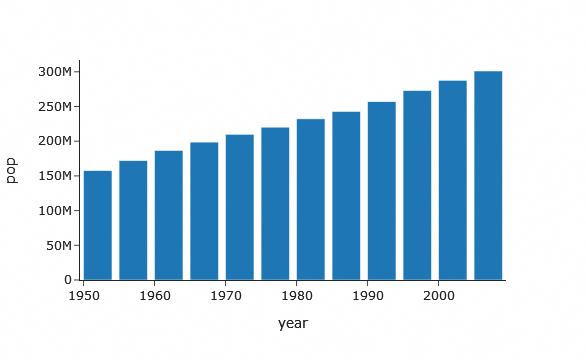

In [120]:
# Creating the bar chart
fig = px.bar(df_us, x = 'year', y = 'pop')

# rendering the chart
fig.show()

### Changing the Background Color
We can quickly change the background color of our chart by updating the `plot_bgcolor` attribute of the `update_layout()` method. 

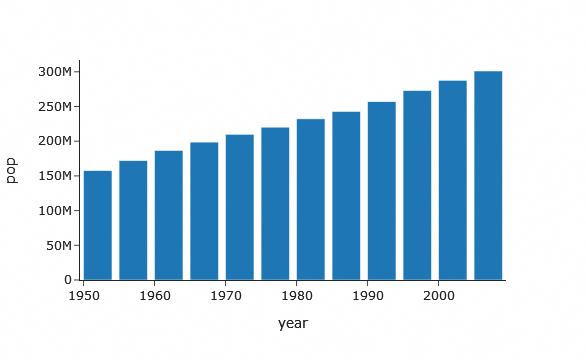

In [121]:
fig.update_layout(plot_bgcolor = 'white')

### Title Customization
We can see that Plotly auto-labels our chart with no title by default. 

How would we need to modify our initial Plotly Express call to add a title?

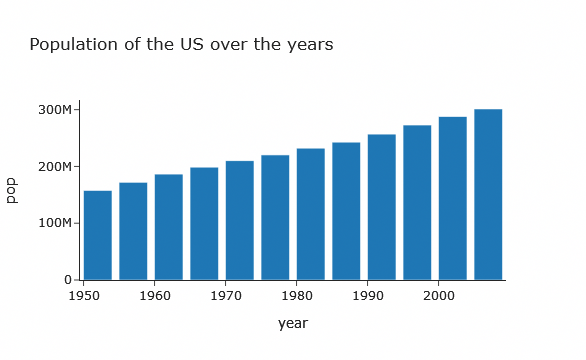

In [122]:
# Creating the bar chart
fig = px.bar(df_us, x = 'year', y = 'pop',
            title='Population of the US over the years')

# Background colo
fig.update_layout(plot_bgcolor = 'white')

# rendering the chart
fig.show()

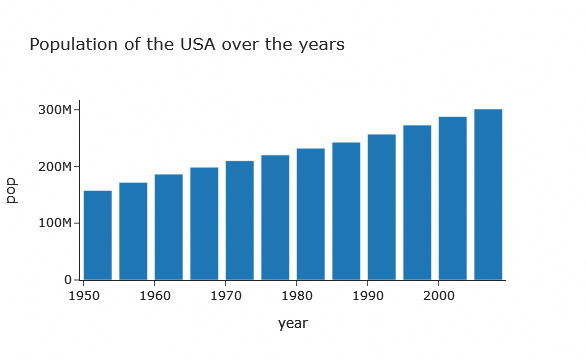

In [123]:
#you can also update the existing chart and set the title
# This overwrites the previous one
fig.update_layout(title_text="Population of the USA over the years")

### Positioning the title
Plotly auto adjusts the title to the left. Which attribute can we use to change this?

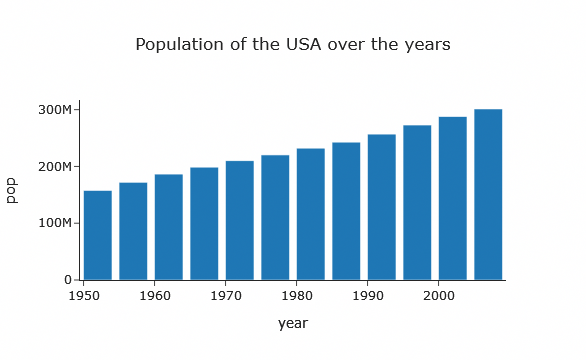

In [124]:
# aligning the title in the middle
fig.update_layout(title_x = 0.5)

### Font family
Changing the font

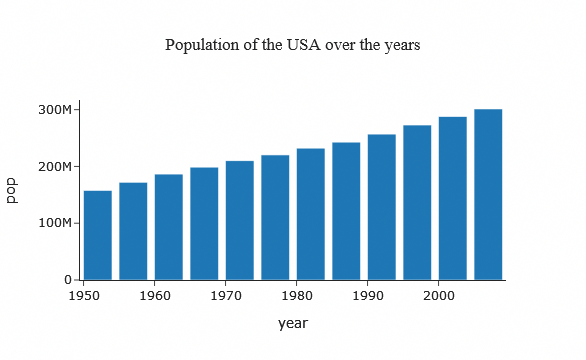

In [125]:
# changing the titel's font
fig.update_layout(title_font_family = 'Times New Roman')

### Font Size
Adjusting the Font Size

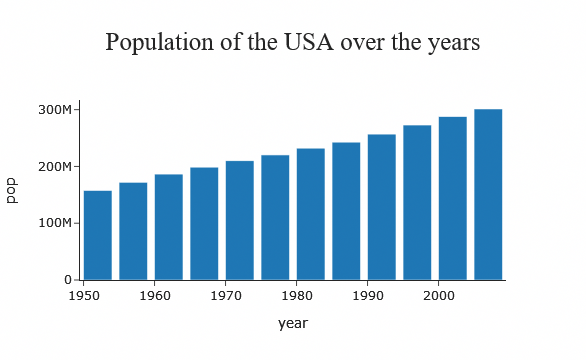

In [126]:
fig.update_layout(title_font_size = 25)

### Subtitle
Currently there is no built in way of adding a subtitle but HTML tags can be done. 

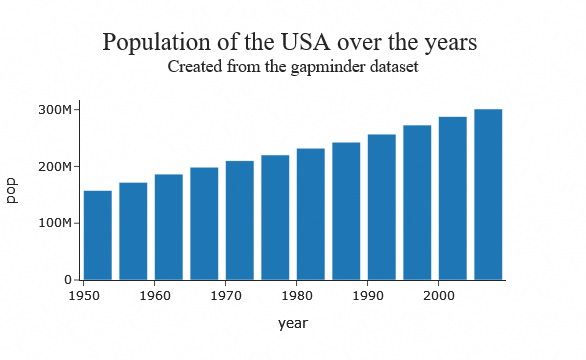

In [127]:
fig.update_layout(
    title_text="Population of the USA over the years <br><sup>Created from the gapminder dataset</sup>"
)

### Bold Font

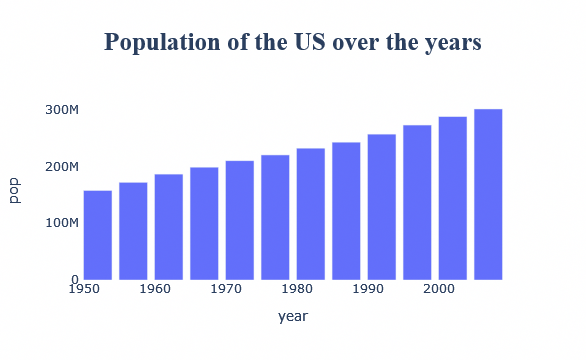

In [31]:
fig.update_layout(title_text = '<b>Population of the US over the years</b>')

### Font Color

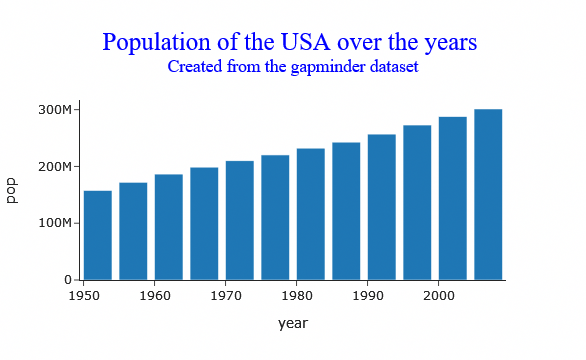

In [128]:
# changing the title's color
fig.update_layout(title_font_color = 'Blue')

### Modifying the labels

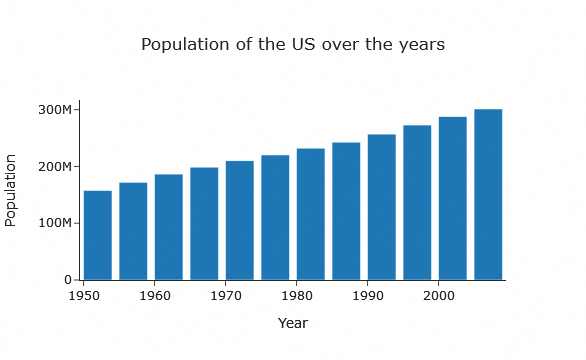

In [129]:
# Creating the bar chart
fig = px.bar(df_us, x = 'year', y = 'pop',
            title= 'Population of the US over the years',
            # chart wide renaming of these straings
            labels = {'lifeExp': 'Life Expectancy',
                        'year' : 'Year',
                         'pop' : 'Population'})


# Background color and positioning
fig.update_layout(title_x = 0.5, plot_bgcolor = 'white')

# rendering the chart
fig.show()

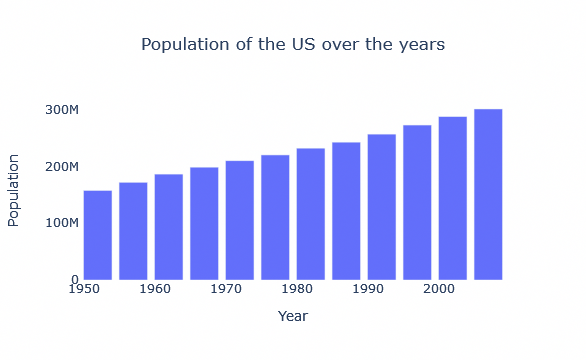

In [41]:
# declare as a variable

labels_ =  ({'lifeExp': 'Life Expectancy',
                        'year' : 'Year',
                         'pop' : 'Population'})

# separate string for the title 
title_= 'Population of the US over the years'


# using the separate variables
fig = px.bar(df_us, x = 'year', y = 'pop',
            title= title_,
            # chart wide renaming of these straings
            labels = labels_)
             
fig.update_layout(title_x=0.5, plot_bgcolor = 'white')

### Changing the category of the axes

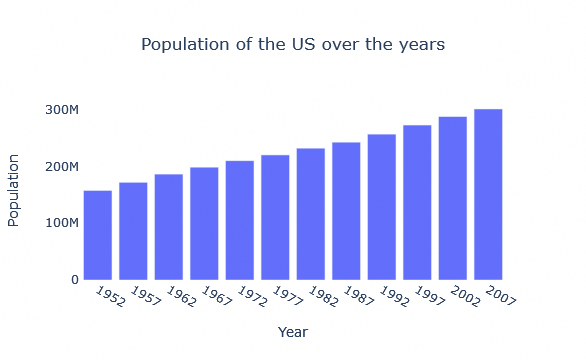

In [42]:
# expected best practice
fig.update_xaxes(type = 'category')

### Adding Data Labels

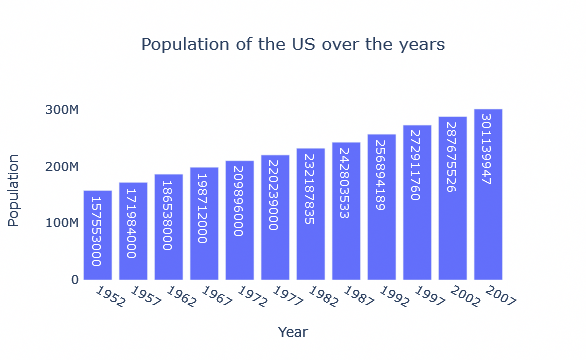

In [47]:
fig = px.bar(df_us, x = 'year', y = 'pop',
            title= title_,
            labels = labels_,
             # data labels with the variable POP
            text = 'pop')
             
fig.update_layout(title_x=0.5, plot_bgcolor = 'white')

fig.update_xaxes(type = 'category')

fig.show()

Easier option for data labels

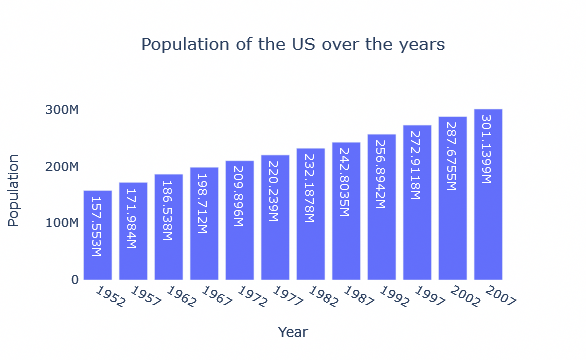

In [48]:
fig = px.bar(df_us, x = 'year', y = 'pop',
            title= title_,
            labels = labels_,
             # using text_auto TRUE is much easier
            text_auto = True)
             
fig.update_layout(title_x=0.5, plot_bgcolor = 'white')

fig.update_xaxes(type = 'category')

fig.show()

### Changing the format of data labels

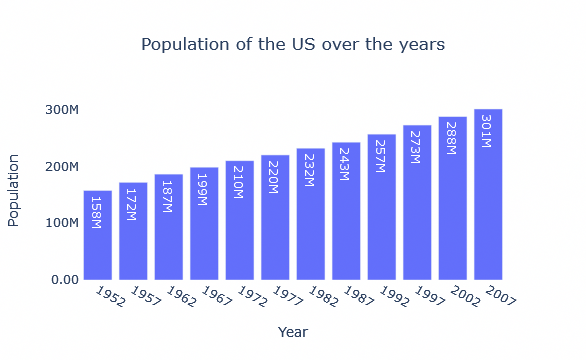

In [50]:
# using d3 format to format our data labels
fig.update_layout(yaxis_tickformat = ".3s") # decimal notation with SI-prefix
# the s is for decimal notation, and the .3 means we want to round the numbers up for the hundrenth

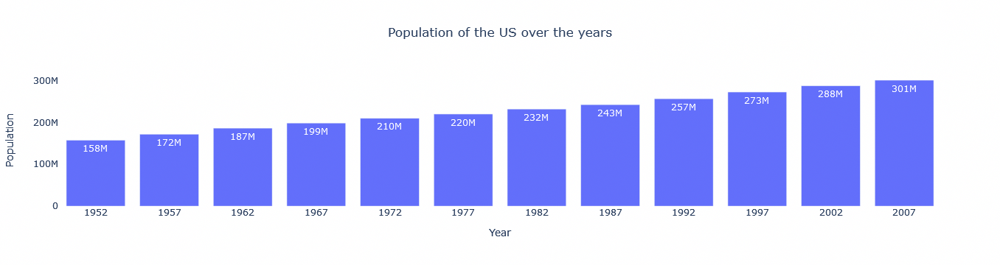

In [56]:
# resetting the chart
fig = px.bar(df_us, x = 'year', y = 'pop',
            title= title_,
            labels = labels_,
            text_auto = True)
             
fig.update_layout(title_x=0.5, plot_bgcolor = 'white')

fig.update_xaxes(type = 'category')

# using the same d3 format this time with texttemplate
fig.update_traces(texttemplate = '%{value:.3s}')


### Positioning the data labels

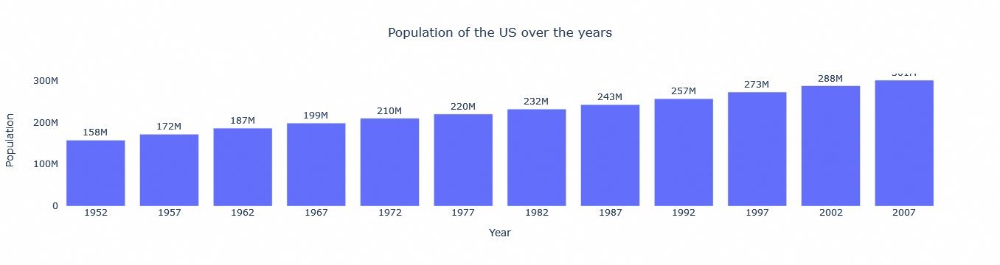

In [57]:
# updating the chart to show the data label on top of bars
fig.update_traces(textposition = 'outside')
# best practice

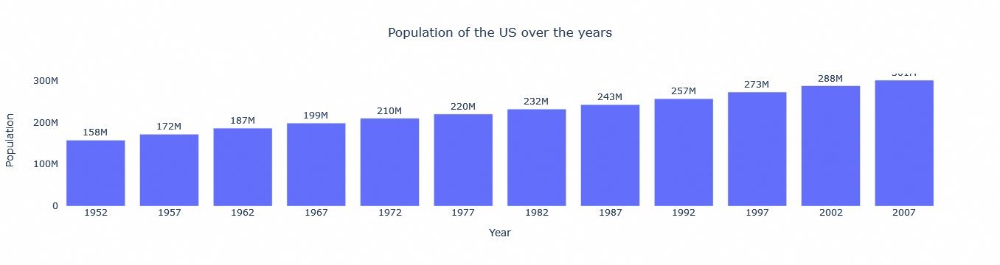

In [60]:
fig = px.bar(df_us, x = 'year', y = 'pop',
            title= title_,
            labels = labels_,
            text_auto = True)
             
fig.update_layout(title_x=0.5, plot_bgcolor = 'white')

fig.update_xaxes(type = 'category')

fig.update_traces(texttemplate = '%{value:.3s}', textposition = 'outside')


### Defining the dimensions of the chart

In [61]:
# creating a separate dict for the values
chart_size = {'height':650, 'width':1500}

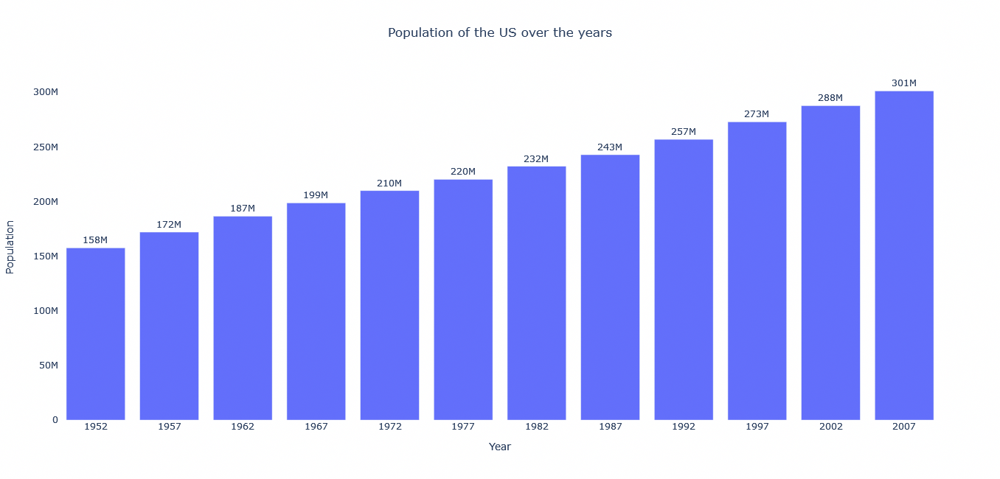

In [62]:
fig.update_layout(chart_size)

### Size of Data Labels

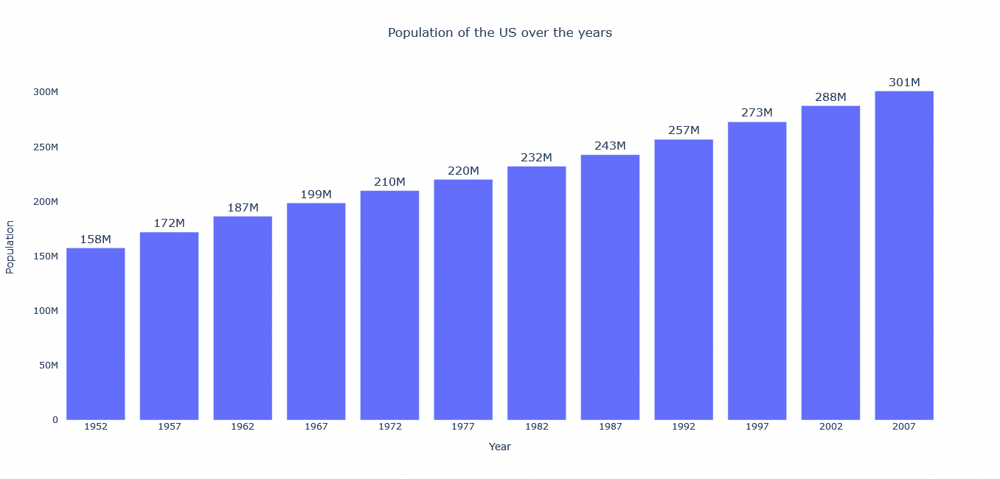

In [65]:
# setting the size of the data Labels
fig.update_traces(textfont_size = 15)

### Size of the axis labels

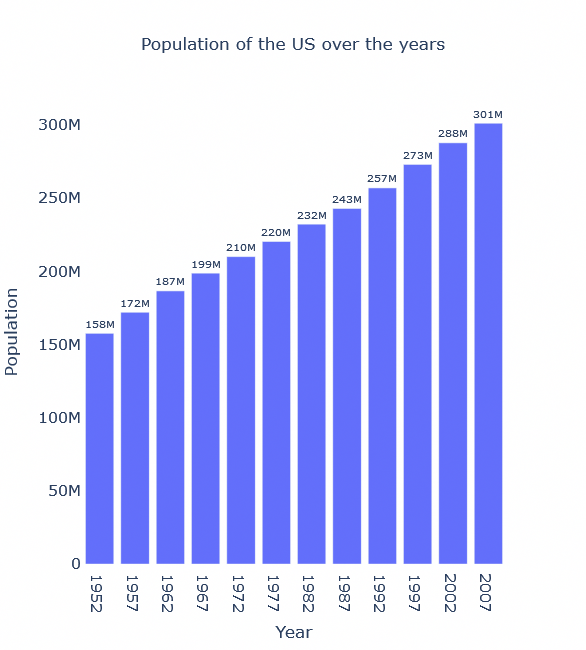

In [68]:
fig.update_xaxes(tickfont_size = 15)
fig.update_yaxes(tickfont_size = 15)
fig.update_xaxes(title_font_size = 17)
fig.update_yaxes(title_font_size = 17)

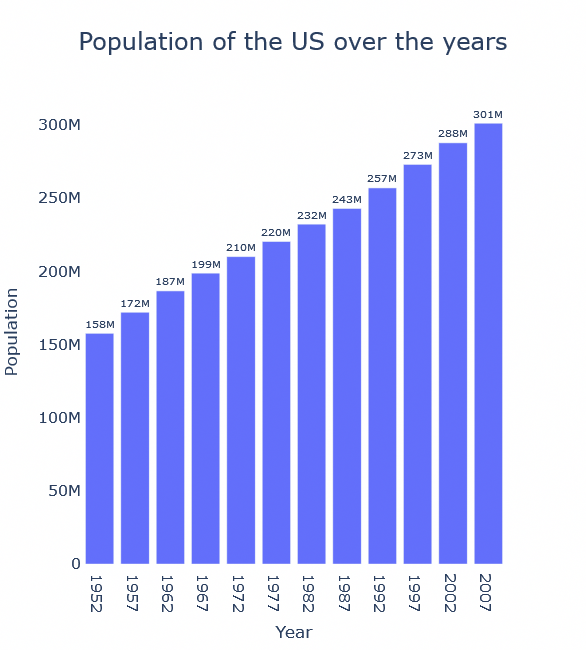

In [71]:
# setting all font sizes to 17
fig.update_layout(font_size = 17)
# best practice

### Changing the color

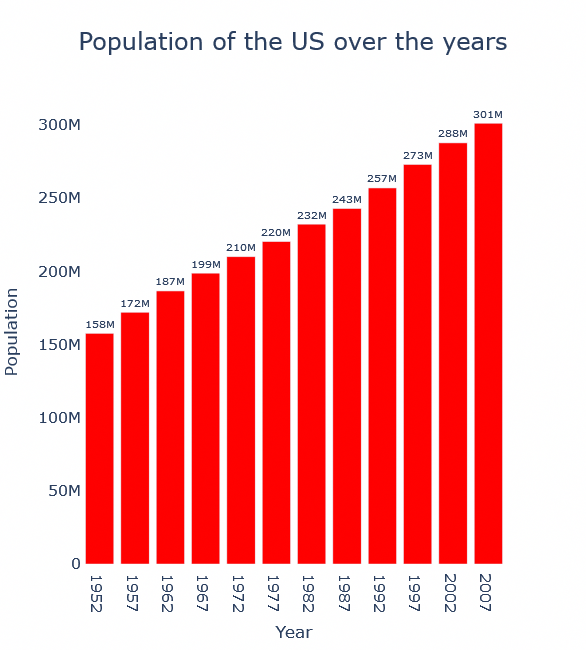

In [72]:
fig.update_traces(marker_color = 'red')

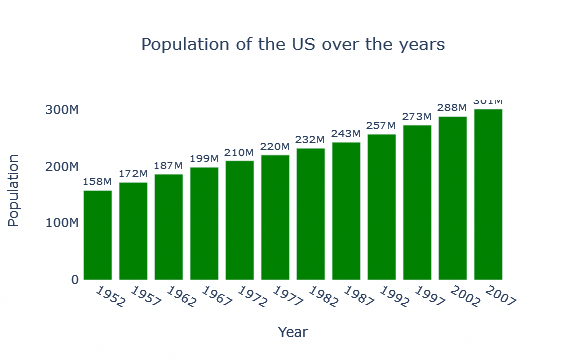

In [74]:
fig = px.bar(df_us, x = 'year', y = 'pop',
            title= title_,
            labels = labels_,
            text_auto = True)
             
fig.update_layout(title_x=0.5, plot_bgcolor = 'white')

fig.update_xaxes(type = 'category')

fig.update_traces(texttemplate = '%{value:.3s}', textposition = 'outside')

fig.update_traces(marker_color = 'green')

### Changing the coloring with a third column

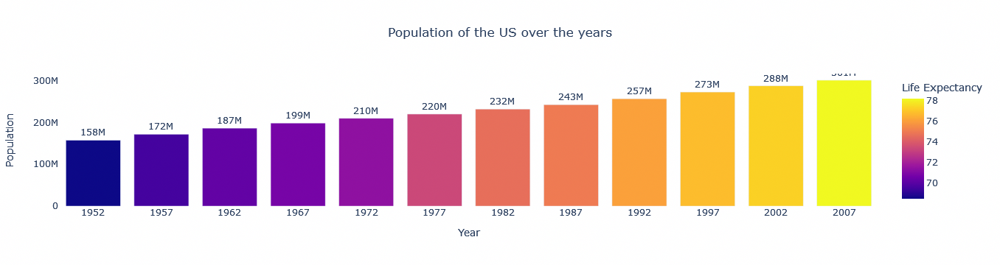

In [81]:
fig = px.bar(df_us, x = 'year', y = 'pop',
            title= title_,
            labels = labels_,
            text_auto = True,
            color = 'lifeExp')
             
fig.update_layout(title_x=0.5, plot_bgcolor = 'white')

fig.update_xaxes(type = 'category')

fig.update_traces(texttemplate = '%{value:.3s}', textposition = 'outside')

### Setting the template of a chart

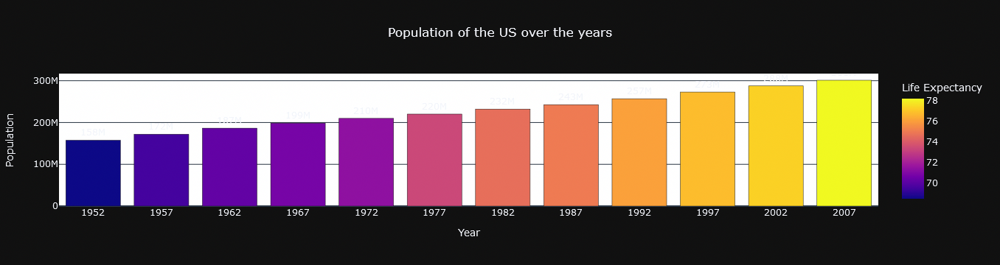

In [85]:
# setting the theme of the chart
fig.update_layout(template = 'plotly_dark')

### Removing Axis Labels (remove to improve)

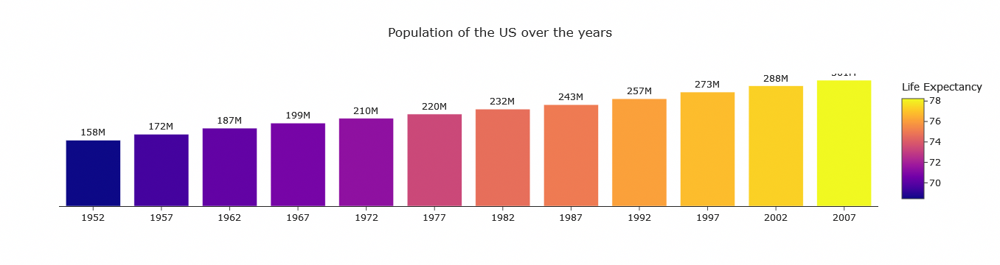

In [87]:
# setting the title text as Name to remove it
fig.update_layout(xaxis_title = None, template = 'simple_white')

# hiding the y axis with the visible attribute
fig.update_yaxes(visible = False)

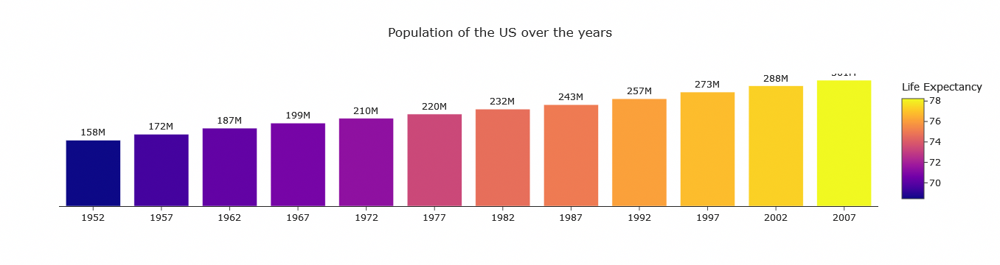

In [88]:
fig = px.bar(df_us, x = 'year', y = 'pop',
            title= title_,
            labels = labels_,
            text_auto = True,
            color = 'lifeExp')
             
fig.update_layout(title_x=0.5, plot_bgcolor = 'white')

fig.update_xaxes(type = 'category')

# setting the title text as Name to remove it
fig.update_layout(xaxis_title = None, template = 'simple_white')

# hiding the y axis with the visible attribute
fig.update_yaxes(visible = False)
# we are basically removing the entire axis

fig.update_traces(texttemplate = '%{value:.3s}', textposition = 'outside')

### Practice Exercise 1

bitcoin dataset: 
df_btc = pd.read_csv('https://raw.githubusercontent.com/bencearato/data/master/coin_Bitcoin.csv')
Exercise 1 - Simple bar chart
Description: 
Let's visualize the life expectancy values of Asian countries with over 100 million of population in 2007 using the gapminder dataset. 
Subtasks:
Add a title to the chart
Color the bars based on the population values
Use data labels
Change the template of the chart

In [91]:
df_btc = pd.read_csv('https://raw.githubusercontent.com/bencearato/data/master/coin_Bitcoin.csv')

In [92]:
df

,country,continent,year,lifeExp,pop,gdpPercap,iso_alpha,iso_num
0,Afghanistan,Asia,1952,28.801,8425333,779.445314,AFG,4
1,Afghanistan,Asia,1957,30.332,9240934,820.853030,AFG,4
2,Afghanistan,Asia,1962,31.997,10267083,853.100710,AFG,4
3,Afghanistan,Asia,1967,34.020,11537966,836.197138,AFG,4
4,Afghanistan,Asia,1972,36.088,13079460,739.981106,AFG,4
...,...,...,...,...,...,...,...,...
1699,Zimbabwe,Africa,1987,62.351,9216418,706.157306,ZWE,716
1700,Zimbabwe,Africa,1992,60.377,10704340,693.420786,ZWE,716
1701,Zimbabwe,Africa,1997,46.809,11404948,792.449960,ZWE,716
1702,Zimbabwe,Africa,2002,39.989,11926563,672.038623,ZWE,716


In [94]:
# creating the filtered dataframe which contains the Asia records only
df_asia = px.data.gapminder().query('continent == "Asia" and pop >= 100000000 and year == 2007')

# show the dataframe
df_asia.head()

,country,continent,year,lifeExp,pop,gdpPercap,iso_alpha,iso_num
107,Bangladesh,Asia,2007,64.062,150448339,1391.253792,BGD,50
299,China,Asia,2007,72.961,1318683096,4959.114854,CHN,156
707,India,Asia,2007,64.698,1110396331,2452.210407,IND,356
719,Indonesia,Asia,2007,70.650,223547000,3540.651564,IDN,360
803,Japan,Asia,2007,82.603,127467972,31656.068060,JPN,392


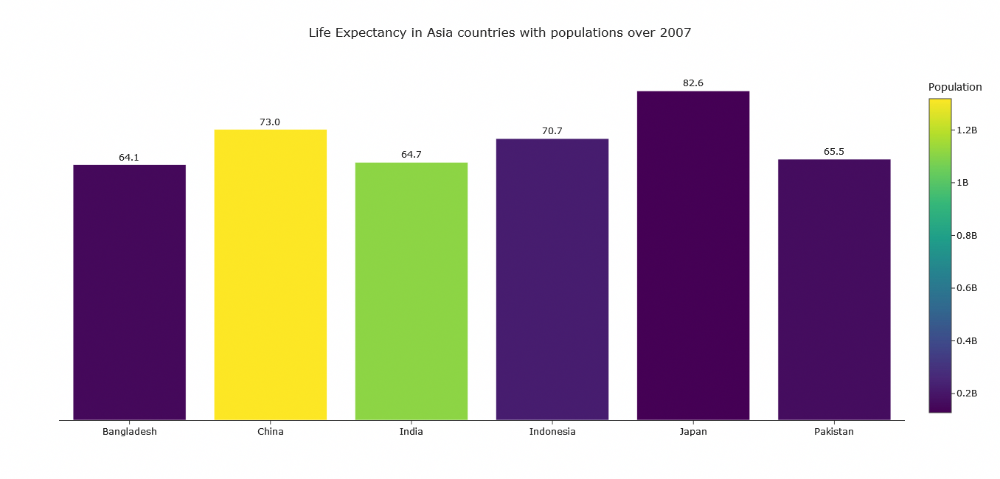

In [101]:
chart_size = {'height' : 650, 'width' : 650}

# declare as a variable
labels2_ =  ({'lifeExp' : 'Life Expectancy',
                        'country': 'Country',
                        'pop' : 'Population'})

title2_ = "Life Expectancy in Asia countries with populations over 2007" 


fig2 = px.bar(df_asia, x = 'country', y = 'lifeExp',
            title= title2_,
            labels = labels2_ ,
            text_auto = True,
            color = 'pop',
            template = 'simple_white')
             
fig2.update_layout(chart_size, 
                   xaxis_title = None, 
                   title_x = 0.5,
                   plot_bgcolor = 'white')

fig2.update_yaxes(visible = False)

fig2.update_traces(texttemplate = '%{value:.3s}', textposition = 'outside')

### Horizonatal Bar Charts

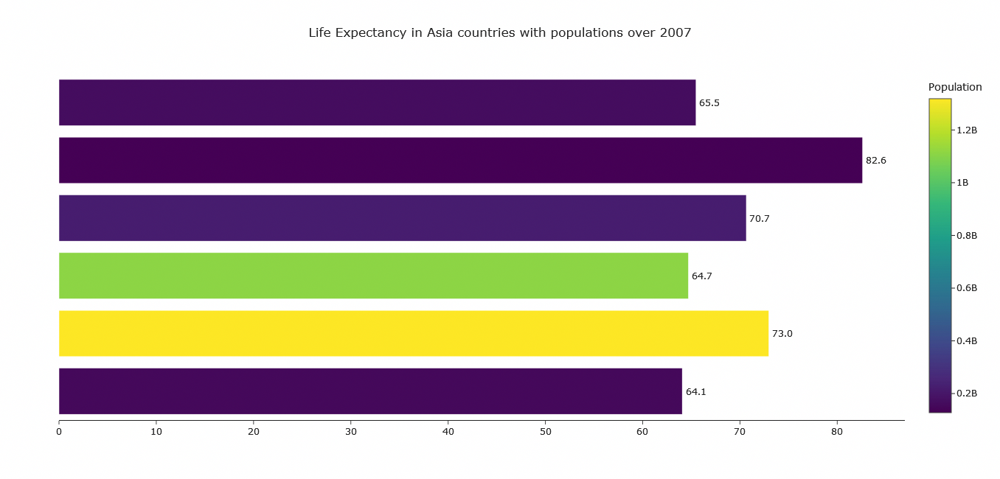

In [102]:
fig2 = px.bar(df_asia, x = 'lifeExp', y = 'country',
            title= title2_,
            labels = labels2_ ,
            text_auto = True,
            color = 'pop',
            template = 'simple_white',
            orientation = 'h')
             
fig2.update_layout(chart_size, 
                   xaxis_title = None, 
                   title_x = 0.5,
                   plot_bgcolor = 'white')

fig2.update_yaxes(visible = False)

fig2.update_traces(texttemplate = '%{value:.3s}', textposition = 'outside')

### Stacked Bar Charts

In [103]:
# reading the csv through Git
df_sum = pd.read_csv('https://raw.githubusercontent.com/bencearato/data/master/gaminder_summarized.csv')

# printing the first 5 rows
df_sum.head()

,Unnamed: 0,index,year,continent,pop
0,0,0,1952,Africa,237640501
1,1,1,1952,Americas,345152446
2,2,2,1952,Asia,1395357351
3,3,3,1952,Europe,418120846
4,4,4,1952,Oceania,10686006


In [104]:
import plotly.io as pio

# setting the defaul template
pio.templates.default = 'simple_white'

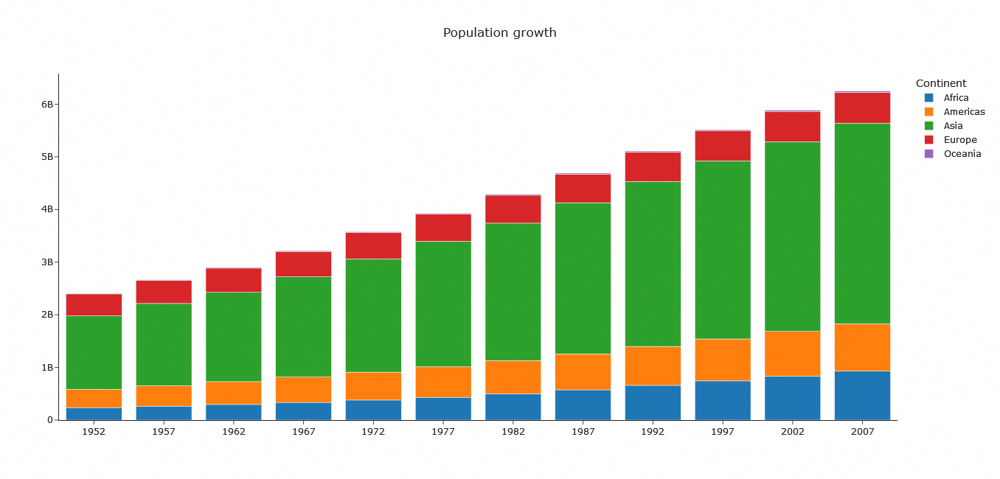

In [110]:
# creating a disctionary for the labels
labels_ = {'continent' : 'Continent', 'pop' : 'Population', 'year' : 'Year' }

title_ = 'Population growth per continent'

stackedBar = px.bar(df_sum, x = 'year', y = 'pop', color = 'continent',
                    labels = labels_, title = title_)
stackedBar.update_layout(chart_size, title_x = 0.5, xaxis_title = None, yaxis_title = None)
stackedBar.update_xaxes(type = 'category')

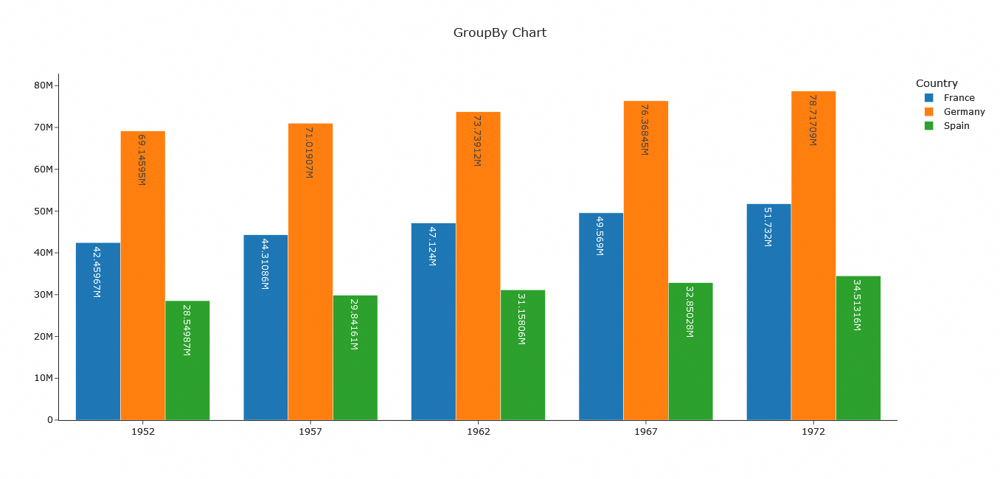

In [113]:
# filtering the dataset
df_eur = px.data.gapminder().query('country in ("France", "Spain", "Germany") and year < 1977')

labels_ = {'country':'Country', 'continent' : 'Continent', 'pop' : 'Population', 'year' : 'Year' }

title_ = 'GroupBy Chart'

c_orders = {'country': ['Spain', 'France', 'Germany']}


groupedBar = px.bar(df_eur, x = 'year', y = 'pop', color = 'country',
                    labels = labels_, title = title_, text_auto = True, 
                    barmode = 'group')
groupedBar.update_layout(chart_size, title_x = 0.5, xaxis_title = None, yaxis_title = None)
groupedBar.update_xaxes(type = 'category')

### Ordering the bars

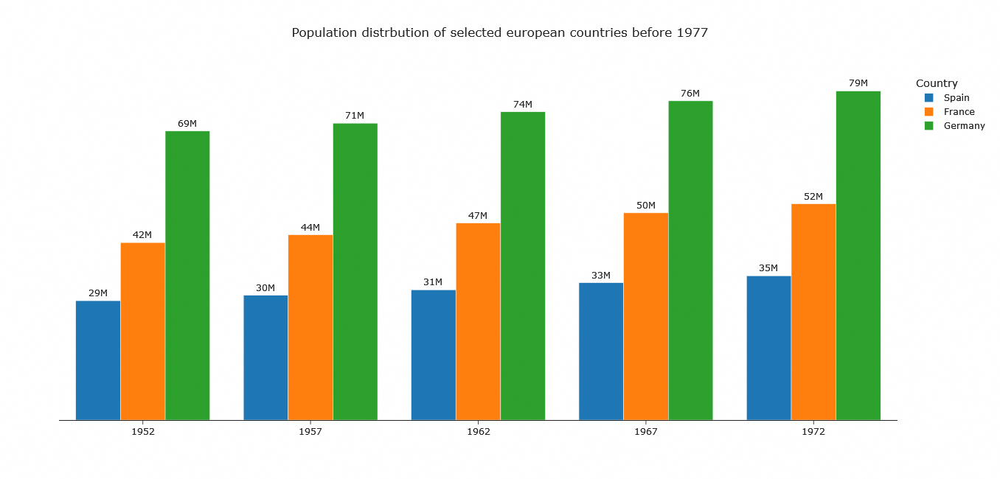

In [114]:
# filtering the dataset
df_eur = px.data.gapminder().query('country in ("France", "Spain", "Germany") and year < 1977')

title_ = 'Population distrbution of selected european countries before 1977'
labels_ = {'country':'Country', 'continent':'Continent', 'pop':'Population', 'year':'Year'}
c_orders = {'country':['Spain', 'France', 'Germany']}

fig3 = px.bar(df_eur, x='year', y='pop', color='country',
              title=title_, labels=labels_, text_auto=True,
              barmode = 'group',
              category_orders = c_orders
             )
fig3.update_layout(chart_size, title_x=.5,  xaxis_title=None)
fig3.update_yaxes(visible=False)
fig3.update_traces(texttemplate = '%{value:.2s}', textposition = 'outside')